In [2]:
import numpy as np
import xarray as xr
from xmitgcm import open_mdsdataset
from matplotlib import pyplot as plt
%matplotlib inline
from xgcm import Grid
import os


In [3]:
data_dir = '/swot/SUM05/dbalwada/500m/run/'

ds = open_mdsdataset(data_dir, delta_t=100, prefix=['U','V','T','W','Eta'], 
                     ignore_unknown_vars=True, geometry='cartesian')

/home/dbalwada/miniconda/envs/dhruvenv/lib/python2.7/site-packages/xmitgcm/mds_store.py:696: UserWarning: Couldn't find available_diagnostics.log in /swot/SUM05/dbalwada/500m/run/. Using default version.
  "in %s. Using default version." % data_dir)
/home/dbalwada/miniconda/envs/dhruvenv/lib/python2.7/site-packages/xmitgcm/utils.py:314: UserWarning: Not sure what to do with rlev = L
  warnings.warn("Not sure what to do with rlev = " + rlev)


In [3]:
ds_mean = open_mdsdataset(data_dir+'mean',grid_dir=data_dir, delta_t=100,  
                     ignore_unknown_vars=True, geometry='cartesian')

/home/dbalwada/.conda/envs/dhruvenv/lib/python2.7/site-packages/xmitgcm-0.2.0-py2.7.egg/xmitgcm/mds_store.py:696: UserWarning: Couldn't find available_diagnostics.log in /swot/SUM05/dbalwada/run625_start2km/mean. Using default version.
  "in %s. Using default version." % data_dir)


In [ ]:
ds

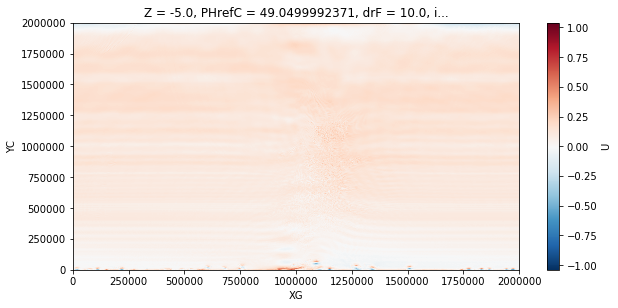

In [5]:
plt.figure(figsize=(10,10))
plt.subplot(211)
ds['U'].isel(time=1,Z=0).plot()
#plt.subplot(212)
#ds['T'].isel(time=258,Z=0).plot()

In [5]:
# calculate the gradient of density 
depth = 0 
tstep = -1

dy = ds.dyC[0,0].values
dx = ds.dxC[0,0].values

grid = Grid(ds)

dTdy = grid.diff(ds['T'].isel(time=tstep), axis='Y')/dy
dTdx = grid.diff(ds['T'].isel(time=tstep), axis='X')/dx

dTdy = grid.interp(dTdy, axis='Y')
dTdx = grid.interp(dTdx, axis='X')

In [6]:
gradT = (dTdx**2 + dTdy**2)**(0.5)

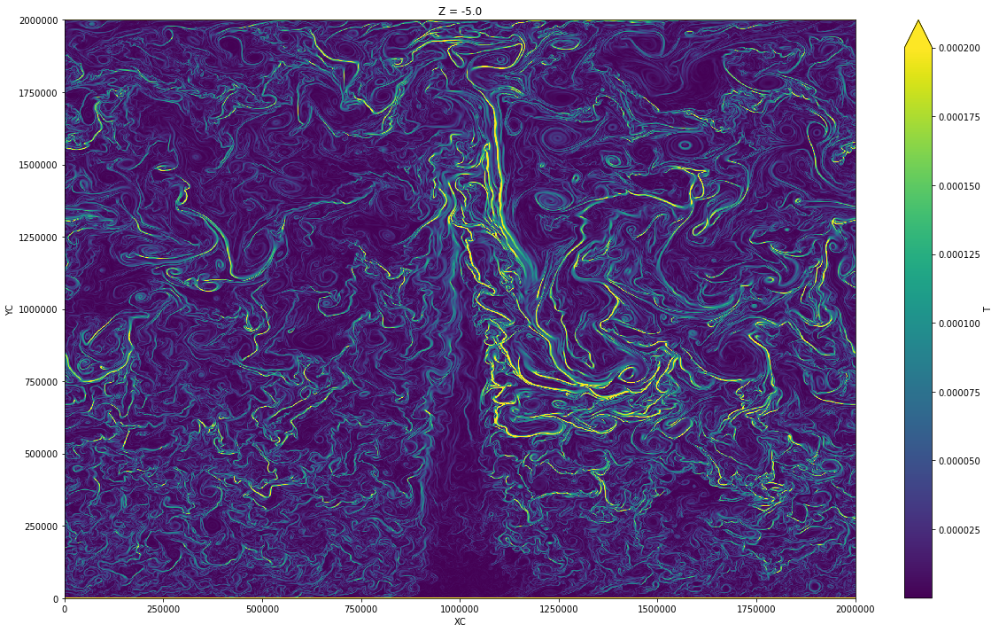

In [10]:
plt.figure(figsize=(20,12))
gradT.isel(Z=0).plot(vmax=0.0002)

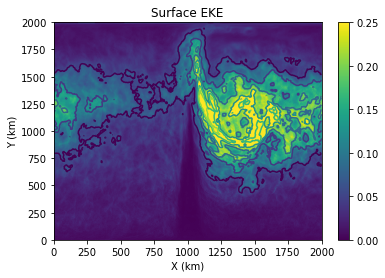

In [16]:
# surface EKE

n = -1 # which averaging period to take
Uprime2 = ds_mean.UUtave.isel(time=n) - ds_mean.uVeltave.isel(time=n)**2
Vprime2 = ds_mean.VVtave.isel(time=n) - ds_mean.vVeltave.isel(time=n)**2

z = 0 # set the level where to calculate the EKE

surface_eke = 0.5 * Uprime2[z].values + Vprime2[z].values

plt.pcolormesh(ds.XC/1000, ds.YC/1000, surface_eke,vmax=0.25)
plt.colorbar()
plt.contour(ds.XC/1000, ds.YC/1000, surface_eke)
plt.xlabel('X (km)')
plt.ylabel('Y (km)')
plt.title('Surface EKE')

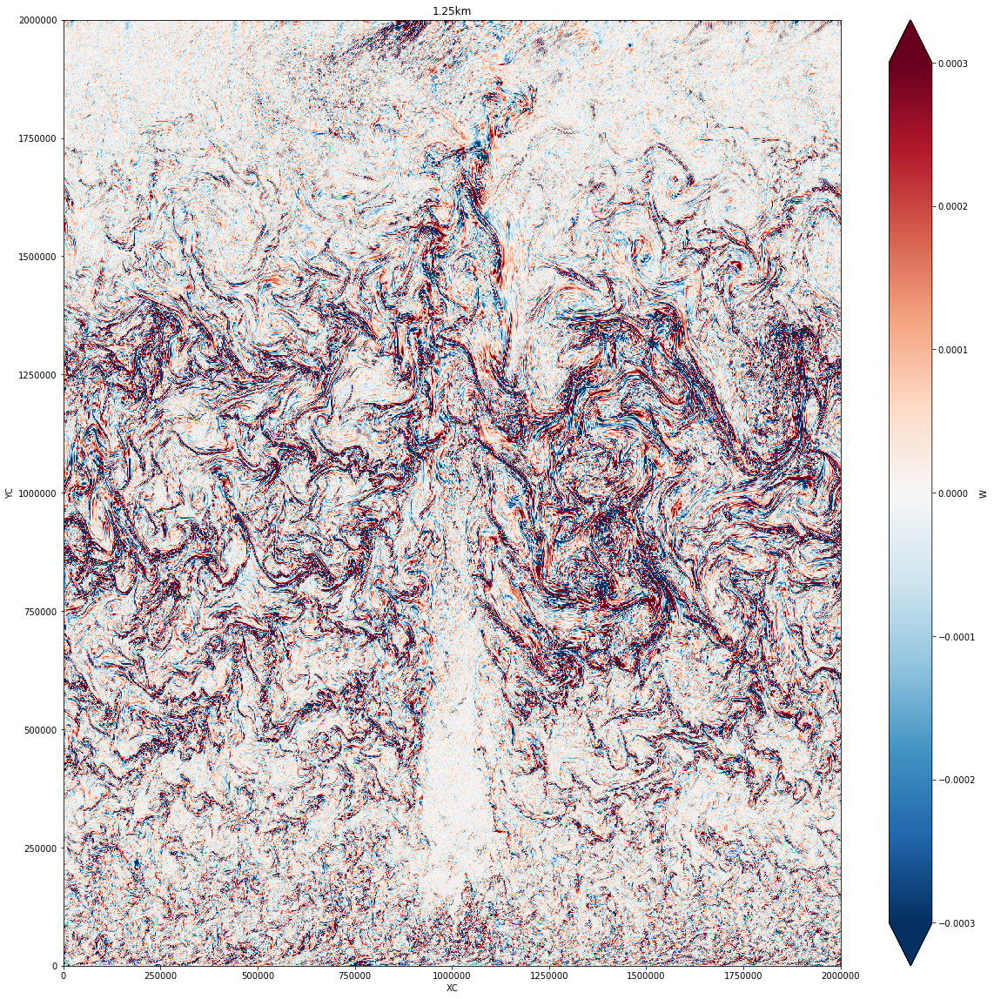

In [35]:
plt.figure(figsize=(20,20))
ds.W.isel(time=-10).sel(Zl=-30,method='nearest').plot(vmin=-0.0003)
plt.title('1.25km')
#plt.colorbar()

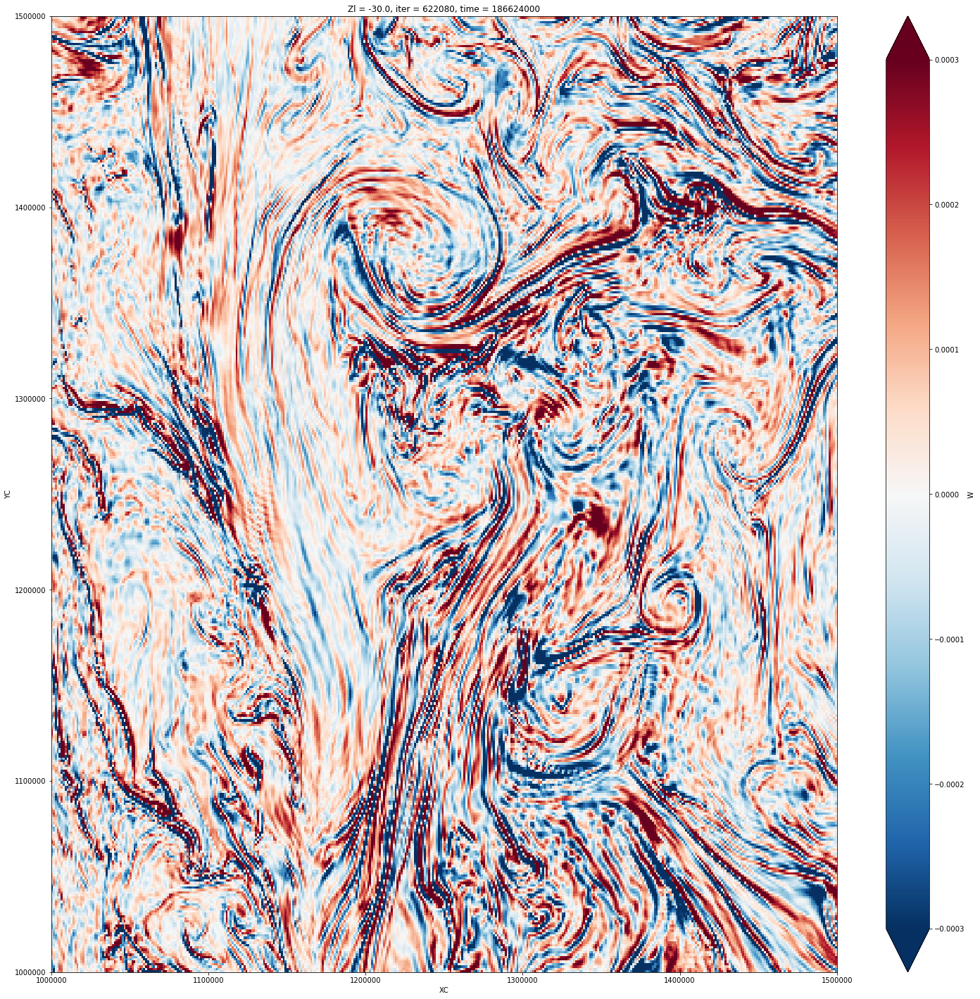

In [30]:
plt.figure(figsize=(25,25))
ds.W.isel(time=-1,XC=slice(800,1200),YC=slice(800,1200)).sel(Zl=-30,method='nearest').plot(vmin=-0.0003)

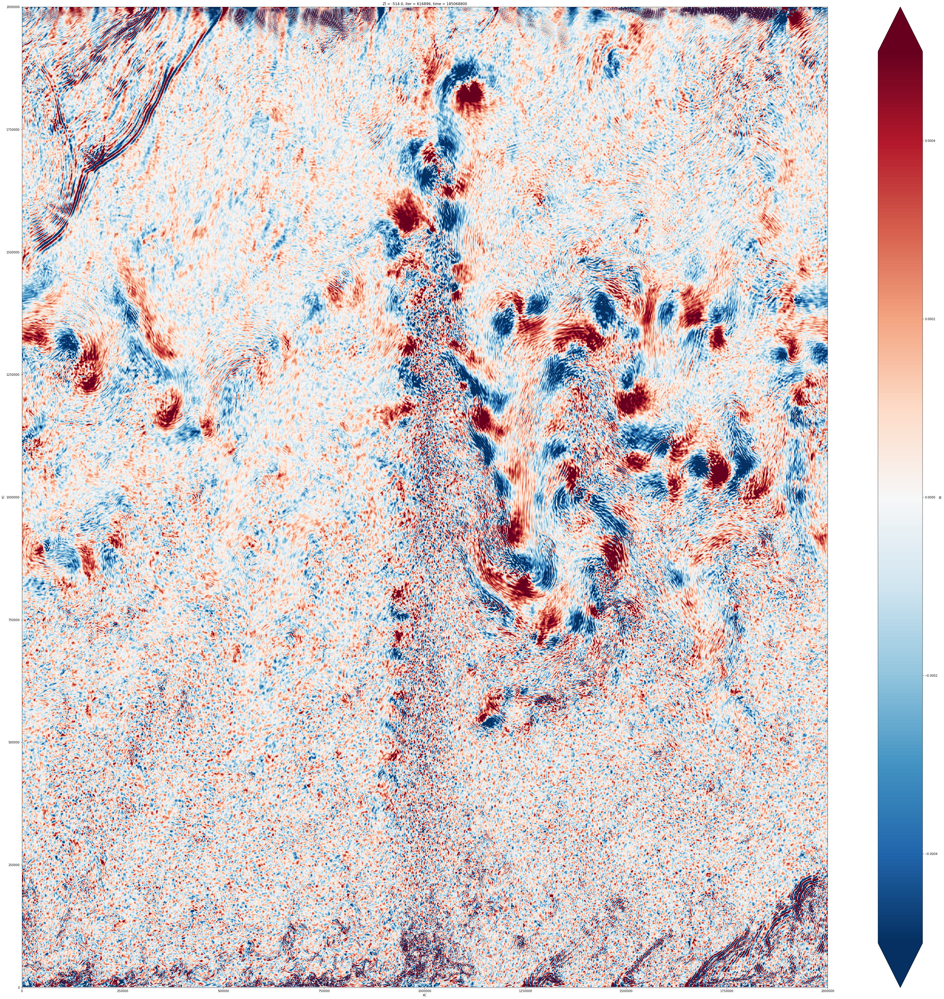

In [38]:
plt.figure(figsize=(60,60))
ds.W.isel(time=-3).sel(Zl=-500,method='nearest').plot(vmin=-0.0005)

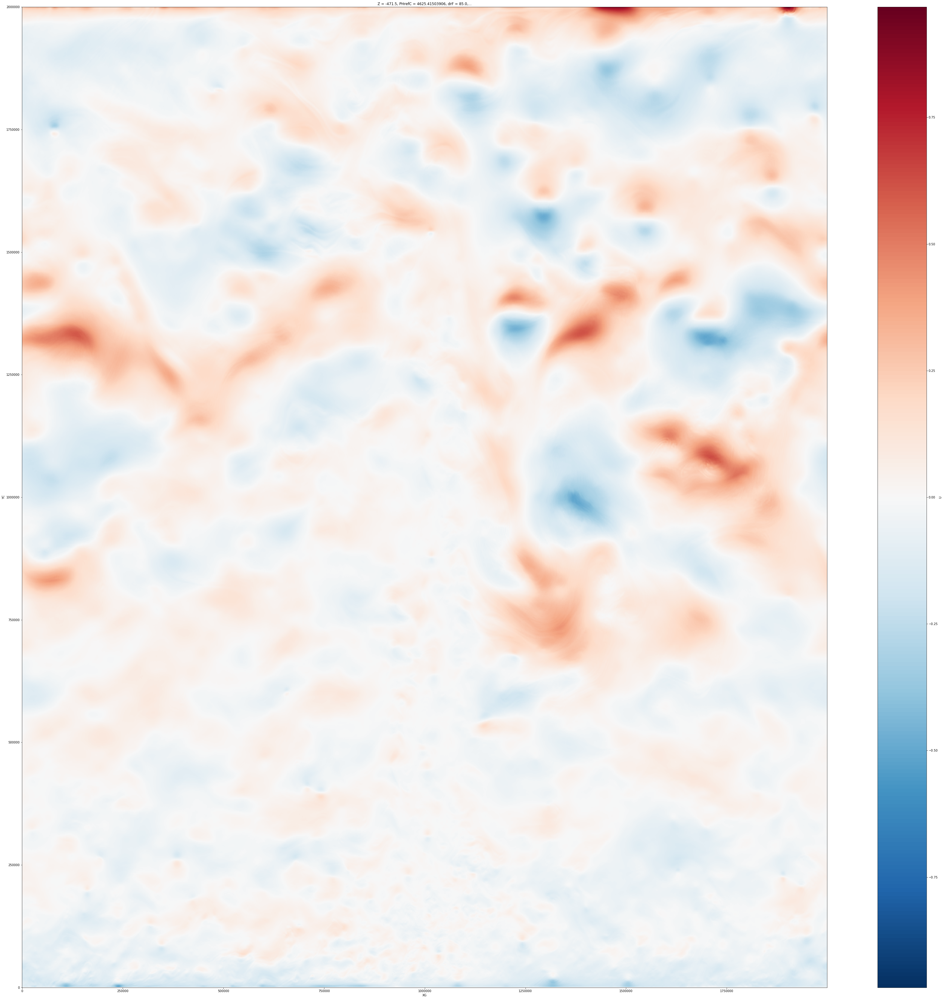

In [50]:
plt.figure(figsize=(60,60))
ds.U.isel(time=-3).sel(Z=-500,method='nearest').plot()

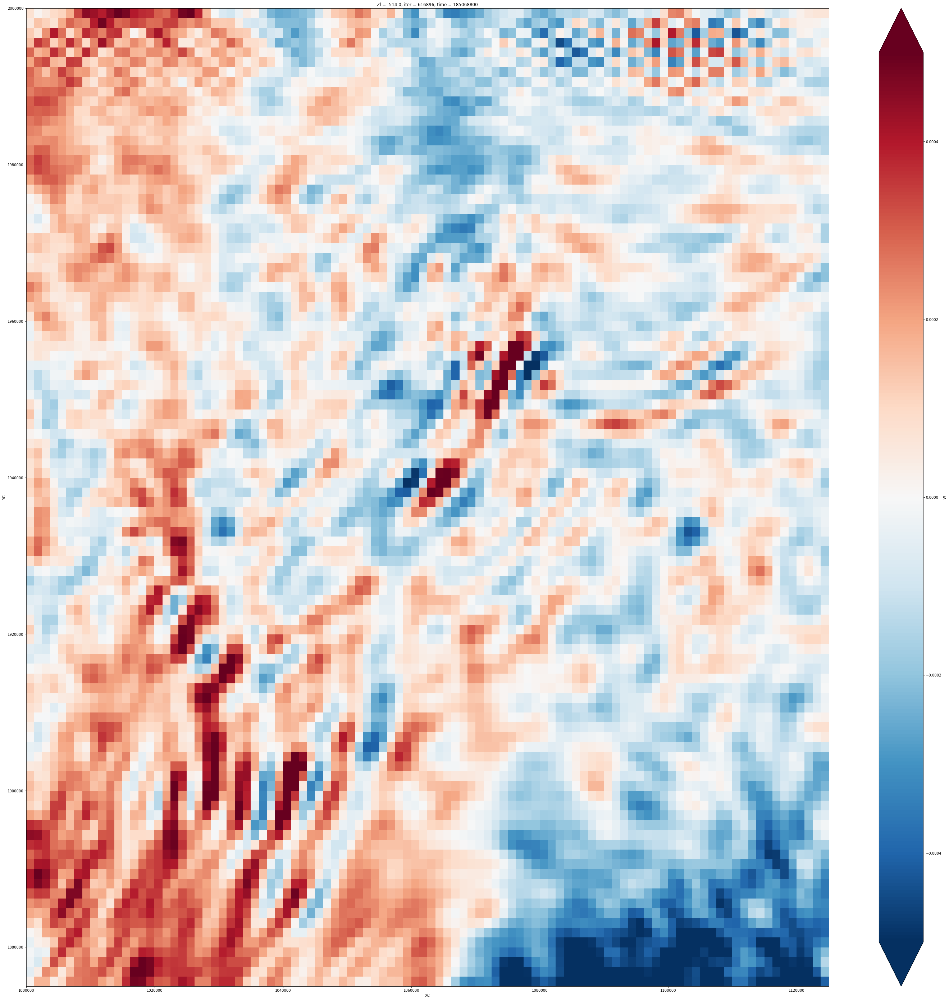

In [52]:
plt.figure(figsize=(50,50))
ds.W.isel(time=-3,XC=slice(800,900),YC=slice(1500,1600)).sel(Zl=-500,method='nearest').plot(vmin=-0.0005)

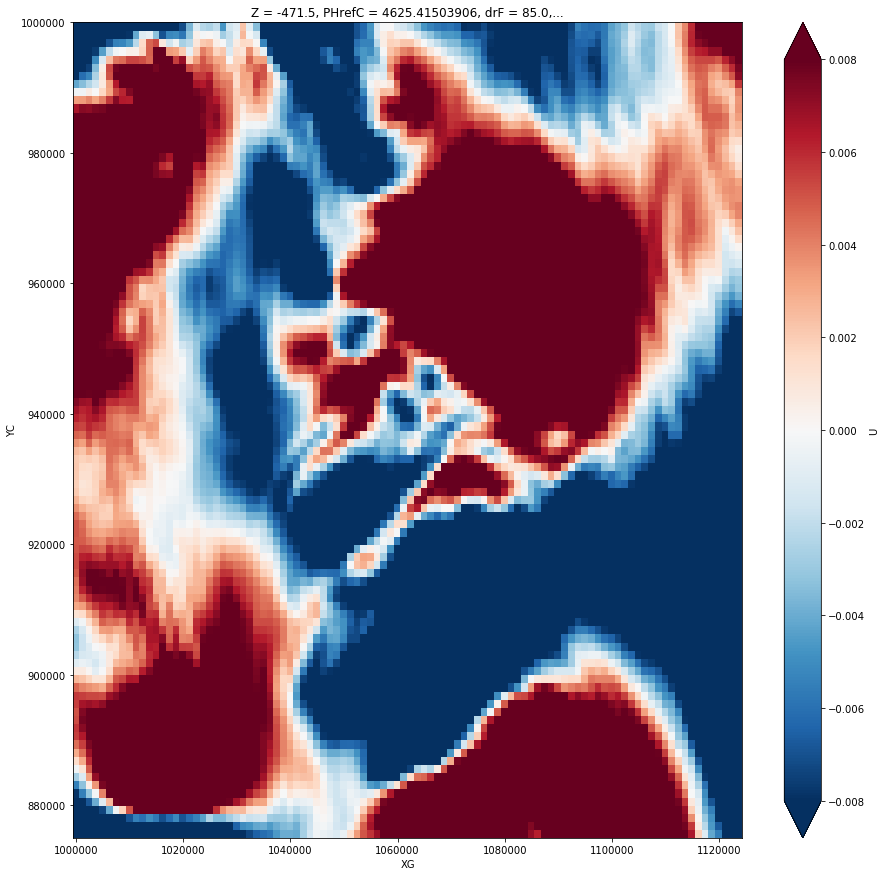

In [47]:
plt.figure(figsize=(15,15))
ds.U.isel(time=-3,XG=slice(800,900),YC=slice(700,800)).sel(Z=-500,method='nearest').plot()

In [8]:
# surface EKE

n = -1 # which averaging period to take
Uprime2 = ds_mean.UUtave.isel(time=n) - ds_mean.uVeltave.isel(time=n)**2
Vprime2 = ds_mean.VVtave.isel(time=n) - ds_mean.vVeltave.isel(time=n)**2

z = 0 # set the level where to calculate the EKE

surface_eke = 0.5 * Uprime2[z].values + Vprime2[z].values

plt.pcolormesh(ds.XC/1000, ds.YC/1000, surface_eke,vmax=0.25)
plt.colorbar()
plt.contour(ds.XC/1000, ds.YC/1000, surface_eke)
plt.xlabel('X (km)')
plt.ylabel('Y (km)')
plt.title('Surface EKE')

15552000

In [ ]:
plt.figure(figsize=(10,10))
plt.subplot(221)
ds.Eta.isel(time=1).plot()
plt.subplot(222)
ds.Eta.isel(time=3).plot()
plt.subplot(223)
ds.Eta.isel(time=7).plot()
plt.subplot(224)
ds.Eta.isel(time=49).plot()


In [ ]:
plt.figure(figsize=(7,7))
ds['W'].isel(time=25,Zl=0).plot(levels=100, vmin=-0.000005)

In [ ]:
plt.figure(figsize=(10,10))

plt.subplot(222)
ds['W'].isel(time=70,Zl=0,XC=slice(450,550),YC=slice(500,800)).plot(levels=100, vmin=-0.000005)

plt.subplot(221)
ds['Eta'].isel(time=70,XC=slice(450,550),YC=slice(500,800)).plot(levels=100)

plt.subplot(223)
ds['T'].isel(time=70,Z=0, XC=slice(450,550),YC=slice(500,800)).plot(levels=100)

plt.subplot(224)
ds['U'].isel(time=70,Z=0, XG=slice(450,550),YC=slice(500,800)).plot(levels=100)

plt.tight_layout()

In [ ]:
plt.figure(figsize=(7,7))
ds['W'].isel(time=70,Zl=35,XC=slice(400,600),YC=slice(500,800)).plot(levels=100, vmin=-.01)

In [ ]:
ds['W'].isel(time=70,Zl=slice(0,15), XC=500,YC=slice(500,800)).plot(levels=100)
plt.tight_layout

In [ ]:
ds['U'].isel(time=slice(10,70)).mean(dim=('time','XG')).plot()

In [ ]:
ds['T'].isel(time=slice(10,70)).mean(dim=('time','XC')).plot()
ds['T'].isel(time=slice(10,70)).mean(dim=('time','XC')).plot.contour(colors='w')

In [5]:
# dt is not used here
n = 0; 
monitor_file = []

data_dir = '/swot/SUM05/dbalwada/run625_start2km/'


for file in sorted(os.listdir(data_dir)):
    if file.startswith("monitor."):
         monitor_file.append(file)

    # concatenate all data files
for n in range(0,len(monitor_file)): 
    print(n)
    if n>0:
         temp = xr.open_dataset(data_dir+'{0}'.format(monitor_file[n]))
         monitor = xr.concat([monitor,temp],dim='T')
    else:
         temp = xr.open_dataset(data_dir+'{0}'.format(monitor_file[n]))
         monitor = temp
        
    # change time axis to days 


monitor['Tyears'] = monitor['T']/24/3600/360

0
1


In [6]:
monitor

<xarray.Dataset>
Dimensions:               (T: 2402)
Coordinates:
  * T                     (T) float64 0.0 2.59e+04 5.18e+04 7.78e+04 ...
Data variables:
    time_tsnumber         (T) int32 0 259 518 778 1037 1296 1555 1814 2074 ...
    time_secondsf         (T) float64 0.0 2.59e+04 5.18e+04 7.78e+04 ...
    dynstat_eta_max       (T) float64 0.0 0.3184 0.5633 0.6585 0.5724 0.4546 ...
    dynstat_eta_min       (T) float64 0.0 -0.302 -0.3804 -0.4624 -0.389 ...
    dynstat_eta_mean      (T) float64 0.0 -1.008e-13 -2.015e-13 -3.031e-13 ...
    dynstat_eta_sd        (T) float64 0.0 0.1259 0.2685 0.3348 0.2792 0.1925 ...
    dynstat_eta_del2      (T) float64 0.0 5.002e-07 4.74e-07 5.857e-07 ...
    dynstat_uvel_max      (T) float64 0.0 1.195 1.628 1.508 1.58 1.314 1.514 ...
    dynstat_uvel_min      (T) float64 0.0 -1.524 -1.208 -1.339 -1.165 -1.288 ...
    dynstat_uvel_mean     (T) float64 0.0 -3.193e-06 -0.0009369 -0.0001358 ...
    dynstat_uvel_sd       (T) float64 0.0 0.05902 0.04217 0.

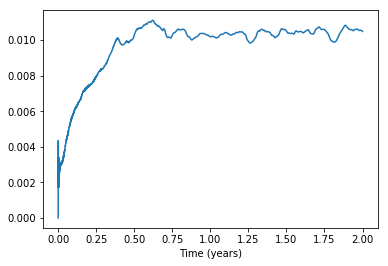

In [7]:
plt.plot(monitor.Tyears, monitor.ke_mean)
plt.xlabel('Time (years)')
#plt.ylabel('Temp_mean')

In [29]:
24*3600*12*30/100.

311040.0

AttributeError: 'Dataset' object has no attribute 'advcfl_uvel_mean'

In [30]:
311040000./2

155520000.0

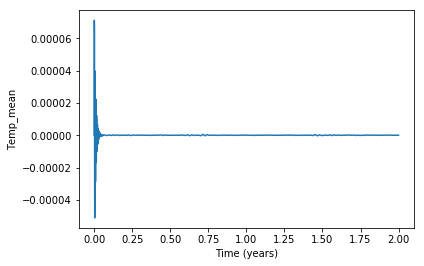

In [11]:
plt.plot(monitor.Tyears, monitor.surfExpan_theta_mean)
plt.xlabel('Time (years)')
plt.ylabel('Temp_mean')

In [38]:
518400*300

155520000

In [50]:
1555200*200/24/3600/360.

10.0

47.5

In [48]:
264/7

37

In [49]:
174/3

58